## Raport 1

Justyna Baczyńska, Igor Hołowacz

In [13]:
# biblioteki 

using Distributions
using Plots
using StatsPlots
using HypothesisTests
using BenchmarkTools
using StatsBase
using MomentClosure
using Random

#### ZADANIE 1

Generator MRG32k3a jest to algorytm generowania liczb pseudolosowych o wysokiej jakości, który wykorzystuje dwie liniowo zależne sekwencje MRG (Multiple Recursive Generators). Algorytm ten został zaproponowany przez Pierre L'Ecuyer w 1999 roku i charakteryzuje się dobrą równomiernością oraz długością okresu. Reguła rekurencyjna algorytmu MRG32k3a opiera się na dwóch sekwencjach liniowo zależnych X i Y. Każda z nich jest generowana przy użyciu wartości z poprzednich trzech kroków, a następnie poddawana operacji modulo z odpowiednimi wartościami m1 i m2:

$X_k=(1403580 X_{k-2}-810728 X_{k-3}) \mod m_q (m_1=2^{32}-209=4294967087)$

$X_k=(527612 Y{k-2}-1370589 Y{k-3}) \mod m_q (m_1=2^{32}-22853 =4294944443)$

$U_k= \begin{cases}
\frac{X_k-Y_k+m_1}{m_1+1}, X_k \leq Y_k \\
\frac{X_k-Y_k}{m_1+1}, X_k > Y_k.
\end{cases}
$

IMPLEMENTACJA

In [14]:
function MRG32K3A_generator(n::Int)
    """
    Funkcja generuje sekwencję n liczb pseudolosowych o rozkładzie jednostajnym U(0,1) za pomocą 
    generatora MRG32k3a.
    
    ARGUMENTY:
        n (Int): liczba liczb pseudolosowych do wygenerowania
        
    WARTOŚĆ ZWRACANA:
        iterator pozwalający na generowanie n liczb pseudolosowych o rozkładzie jednostajnym U(0,1)
    """
    m1 = 4294967087
    m2 = 4294944443
    p1 = m1 + 1
    x3, x2, x1 = 1, 2, 3
    y3, y2, y1 = 1, 2, 3
    
    return Base.Iterators.map(1:n) do _
        xi = mod(1403580*x2 - 810728*x3, m1)
        yi = mod(527612*y1 - 1370589*y3, m2)
        if xi > yi
            u = (xi - yi) / p1
        else
            u = (xi - yi + m1) / p1
        end
        x3, x2, x1 = x2, x1, xi
        y3, y2, y1 = y2, y1, yi
        u
    end
end

MRG32K3A_generator (generic function with 1 method)

Tak zaimplementowany algorytm sprawdzamy najpierw porównując go do niezależnego ciągu zmiennych losowych o rozkładzie U(0,1).

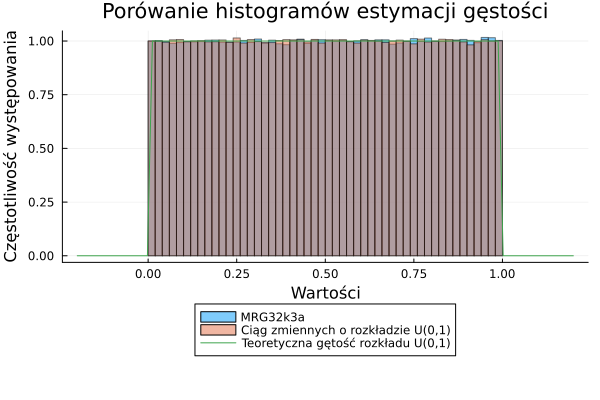

In [15]:
samples = collect(MRG32K3A_generator(10^6))

function random_uniform(n::Int)
    return rand(n)
end

# porównanie rozkładów za pomocą histogramów estymujących gęstości
u = random_uniform(10^6)
histogram(samples, alpha=0.5, bins=50, label="MRG32k3a", normalize=true)
histogram!(u, alpha=0.5, bins=50, label="Ciąg zmiennych o rozkładzie U(0,1)", normalize=true)
xs = LinRange(-0.2,1.2,100)
plot!(xs,pdf.(Uniform(0,1),xs), label="Teoretyczna gętość rozkładu U(0,1)")
plot!(xlabel="Wartości", ylabel="Częstotliwość występowania", title="Porówanie histogramów estymacji gęstości", legend = :outerbottom)

Widzimy, że wygenerowany histogram estymowanej gęstości generatora MRG32k3a pokrywa się z teoretyczną gęstością rozkładu jednostajnego U(0,1).

Możemy również wyświetlić realizację próbek wygenerowanych przez generator MRG32k2a i porównać go z realizacją próbek z rozkładu U(0,1).

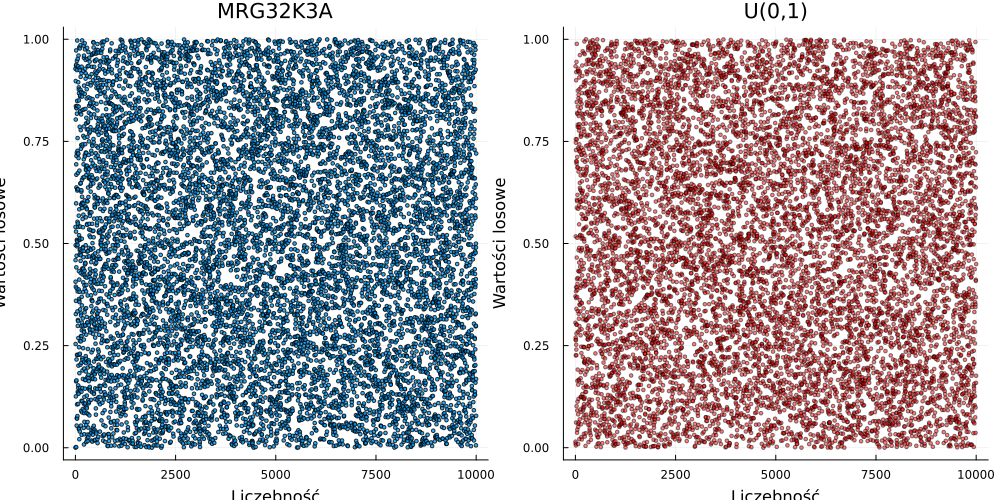

In [16]:
size = 10^4
samples = collect(MRG32K3A_generator(size))
fig1 = scatter(samples, alpha=0.8, ms=2, title="MRG32K3A", xlabel="Liczebność", ylabel="Wartości losowe")
fig2 = scatter(rand(size), alpha=0.5, ms=2, title="U(0,1)", color=:red, xlabel="Liczebność", ylabel="Wartości losowe")
plot(fig1, fig2, layout=(1,2), size=(1000,500), legend = false)

TESTY

Generujemy próbkę, z której będziemy korzystać w trakcie testów statystycznych oraz statystk opisowych.

In [17]:
samples = collect(MRG32K3A_generator(100_000));

Wykonamy test momentów, polegający na porównaniu empirycznych momentów wygenerowanych liczb pseudolosowych z teoretycznymi moemntami rozkładu jednostajnego U(0,1).

In [18]:
n = length(samples)
for i in 1:4
    m = mean(samples .^ i)
    σ = sqrt(var(samples) / n)
    println("Moment $i: empiryczny = $m, teoretyczny = 1/$(i+1), błąd standardowy = $σ")
end

Moment 1: empiryczny = 0.4995839100648563, teoretyczny = 1/2, błąd standardowy = 0.0009143194170366911
Moment 2: empiryczny = 0.33318124685272554, teoretyczny = 1/3, błąd standardowy = 0.0009143194170366911
Moment 3: empiryczny = 0.2500584904380579, teoretyczny = 1/4, błąd standardowy = 0.0009143194170366911
Moment 4: empiryczny = 0.20020711488137646, teoretyczny = 1/5, błąd standardowy = 0.0009143194170366911


Widzimy, że obliczone empirycznie momenty i teoretyczne nie różnią się od siebie drastycznie. 

Przejdziemy teraz do testu Kołmogorova-Smirova, polegającym na porównaniu dystrybuanty empirycznej wygenerowanych liczb pseudolosowych z dystrybuantą teoretyczną rozkładu jednostajnego U(0,1).

In [19]:
ExactOneSampleKSTest(samples, Uniform(0, 1))

Exact one sample Kolmogorov-Smirnov test
----------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.00211828

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.7606

Details:
    number of observations:   100000


Widzimy, że wartość $p$ jest więszka od 0.05, zatem nie ma odchyleń od rozkładu jednostajnego U(0,1).

Możemy też użyć testu jendnostajności Chi-kwadrat Pearsona, polegający na a podziale przedziału [0, 1) na $k$ równych podprzedziałów i zliczeniu liczby wygenerowanych liczb pseudolosowych, które wpadły do każdego z tych przedziałów. Następnie porównuje się oczekiwaną liczbę liczb pseudolosowych w każdym podprzedziale z rzeczywistą liczbą liczb pseudolosowych w tym podprzedziale za pomocą testu chi-kwadrat.

In [20]:
k=10
n = length(samples)
f = 1 / k # oczekiwana częstość w każdym przedziale
observed, expected = zeros(Int, k), fill(n * f, k)

for x in samples
    bin = min(Int64(floor(x / (1 / k))) + 1, k)
    observed[bin] += 1
end

χ2 = sum((observed .- expected) .^ 2 ./ expected)
p_value = ccdf(Chisq(k - 1), χ2)

println("Chi-square test p-value: ", p_value)

Chi-square test p-value: 0.9787979661367826


Widzimy, że ponownie wartość $p$ wynosi więcej niż 0.05 więc nie wykazuje odchyleń.

Możemy też sprawdzić wydajność naszego generatora przy użyciu komendy `benchmark` i porównać go z wbudowaną funkcją `rand`.

In [21]:
@benchmark MRG32K3A_generator(100_000)

BenchmarkTools.Trial: 10000 samples with 999 evaluations.
 Range (min … max):  20.921 ns …  40.105 μs  ┊ GC (min … max):  0.00% … 0.00%
 Time  (median):     45.746 ns               ┊ GC (median):     0.00%
 Time  (mean ± σ):   73.771 ns ± 564.646 ns  ┊ GC (mean ± σ):  13.99% ± 2.62%

   ▇     █▂                                                     
  ▂█▂▁▁▂▅██▅▃▃▃▂▂▂▂▂▂▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▂
  20.9 ns         Histogram: frequency by time          201 ns <

 Memory estimate: 96 bytes, allocs estimate: 6.

In [22]:
@benchmark rand(100_000)

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):   52.400 μs …  34.059 ms  ┊ GC (min … max):  0.00% … 0.00%
 Time  (median):     207.200 μs               ┊ GC (median):     0.00%
 Time  (mean ± σ):   309.789 μs ± 858.033 μs  ┊ GC (mean ± σ):  15.78% ± 7.30%

  █ ▃  ▆▆                                                        
  █▆█▆▅███▇▇▇▅▄▄▄▃▃▃▃▃▃▃▃▃▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▂▂▂▁▁▂▁▂▂▂▂ ▃
  52.4 μs          Histogram: frequency by time         1.55 ms <

 Memory estimate: 781.30 KiB, allocs estimate: 2.

#### ZADANIE 2

W zadaniu mamy zaimplementować **metodę akceptacji-odrzucenia** (1947) do wygenerowania rozkładu Poissona używając rozkładu geometrycznego.

Założenia naszej symulacji:
* potrafimy  wygenerować realizacje zmiennej losowej $Y$ o rozkładzie geometrycznym z prarametrem $p$, gdzie $q_i=P(Y=i)=(1-p)^{i-1}p$, $i=1,2,...$ oraz $\sum_i q_i=1$, przy czym zbiory wartości $Y$ oraz szukanej zmiennej są takie same,
* istnieje stała $0<c<\infty$  taka, że $\max \frac{p_i}{q_i} \leq c$, gdzie $p_i$ to funkcja prawdopodobieństwa rozkładu Poissona, czyli $p_i=P(X=i)=\frac{\lambda^ie^{-\lambda}}{k!}$.

Używany algorytm:
1. generujemy $Y$,
2. generujemy $U\sim U(0,1)$, przy czym $U$ jest niezależne od $Y$,
3. jeśli $U\leq \frac{p_Y}{cq_Y}$ zawracamy $X=Y$, w przeciwnym razie wracamy do punktu 1. 

IMPLEMENTACJA

In [23]:
function accept_reject(p, λ, size)
    """
    Funkcja generuje size próbek z rozkładu Poissona o parametrze 'λ' przy użyciu metody akceptacji-odrzucenia z 
    rozkładem geometrycznym o parametrze p. Zwraca wektor wygenerowanych próbek oraz liczbę zaakceptowanych i 
    odrzuconych próbek.

    PARAMETRY:
        p (Float64): parametr rozkładu geometrycznego
        λ (Float64): parametr rozkładu Poissona
        size (Int): liczba próbek do wygenerowania

    WARTOŚĆ ZWRACANA:
        result (Vector{Int64}): wektor wygenerowanych próbek
        rejected (Int): liczba odrzuconych próbek.
    """
    result = Vector{Int64}(undef, size)
    c = maximum([exp(-λ) * λ^x / factorial(big(x)) / ((1 - p)^(x - 1) * p) for x in 1:20])
    rejected = 0
    for i in 1:size
        x = rand(Geometric(p))
        while c*rand() >= (exp(-λ) * λ^x / factorial(big(x)))/((1 - p)^(x - 1) * p)
            x = rand(Geometric(p))
            rejected += 1
        end
        result[i] = x
    end
    return result, rejected
end

accept_reject (generic function with 1 method)

Sprawdzamy czy nasz algorytm jest potencjalnie zgodny porównując histogram, który estymuje gęstość z teoretyczną funkcją rozkładu prawdopodobienstwa Poissona.

1416777

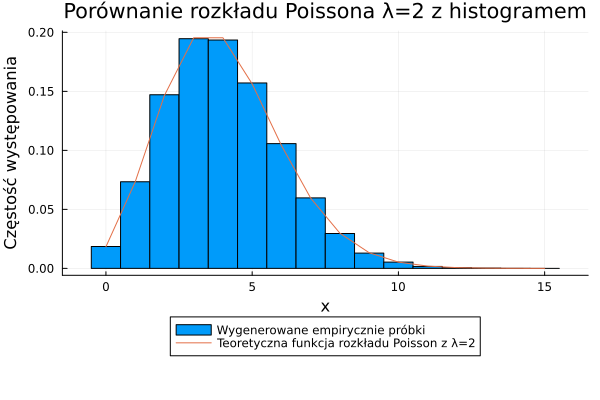

In [24]:
λ = 4
p = 0.5
size = 100_000
samples, rejected = accept_reject(p, λ, size)
println(rejected)

histogram(samples, bins=-0.5:1:15.5, normalize=true, label="Wygenerowane empirycznie próbki" )
x = 0:15
plot!(x, pdf.(Poisson(λ), x), label="Teoretyczna funkcja rozkładu Poisson z λ=2")
plot!(legend=:outerbottom, xlabel="x", ylabel="Częstość występowania", title="Porównanie rozkładu Poissona λ=2 z histogramem")

Możemy porównać również dystrybuanty.

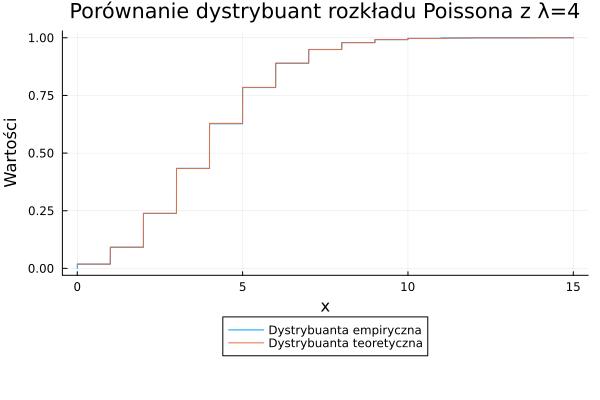

In [25]:
ecdfplot(samples, label="Dystrybuanta empiryczna")
plot!(x->cdf.(Poisson(4),x), label="Dystrybuanta teoretyczna")
plot!(legend=:outerbottom, xlabel="x", ylabel="Wartości", title="Porównanie dystrybuant rozkładu Poissona z λ=4")

Widzimy, że dystrybuanty się pokrywają, więc przechodzimy do dokładniejszych testów.

TESTY

Genereujmy próbkę, z ktrórej będziemy korzystać podczas testów statystycznych oraz statystyk opisowych.

In [26]:
λ = 3
size = 10^4
samples, rejected = accept_reject(0.5, λ, size)

([2, 3, 4, 3, 7, 0, 2, 4, 3, 3  …  2, 4, 2, 4, 1, 3, 2, 4, 3, 4], 55076)

In [27]:
@benchmark accept_reject(0.5, λ, size)

BenchmarkTools.Trial: 54 samples with 1 evaluation.
 Range (min … max):  66.596 ms … 180.087 ms  ┊ GC (min … max):  0.00% … 29.94%
 Time  (median):     81.276 ms               ┊ GC (median):     0.00%
 Time  (mean ± σ):   95.282 ms ±  28.505 ms  ┊ GC (mean ± σ):  10.03% ± 12.22%

  █       ▄▁                                                    
  █▇▄▁▄▇▁▇██▄▁▆▁▄▄▄▁▄▁▁▁▁▄▁▁▄▁▁▄▁▄▁▄▁▁▇▆▁▁▁▆▆▁▁▁▁▁▁▄▁▁▄▁▁▁▁▁▁▄ ▁
  66.6 ms         Histogram: frequency by time          162 ms <

 Memory estimate: 36.27 MiB, allocs estimate: 885540.

Zaczniemy od testów momentów.

In [28]:
empirical_moments = [mean(samples), moment(samples, 2), moment(samples, 3), moment(samples, 4)]
theoretical_moments = [λ, λ, λ, λ^3]
print(empirical_moments, theoretical_moments)

[2.9635, 2.975367750000151, 3.2155513957498556, 31.309185126780708][3, 3, 3, 27]

Przejdźmy do testu Kołmogorova-Smirnova, pozwalającego na porównanie dwóch dystrybuant i określenie, czy są one istotnie różne.

In [29]:
samples_P = rand(Poisson(λ), size)
ks = ApproximateTwoSampleKSTest(samples, samples_P)

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests C:\Users\igorh\.julia\packages\HypothesisTests\BgrVj\src\kolmogorov_smirnov.jl:167


Approximate two sample Kolmogorov-Smirnov test
----------------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.2356

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-99

Details:
    number of observations:   [10000,10000]
    KS-statistic:              16.659435764755074


Skoro wartość $p$ wynosi więcej niż 0.05 to nie ma odchyleń.

Wykonamy też test Andersona-Darlinga.

In [30]:
samples_P = rand(Poisson(λ), size)
ad = KSampleADTest(samples, samples_P)

k-sample Anderson-Darling test
------------------------------
Population details:
    parameter of interest:   not implemented yet
    value under h_0:         NaN
    point estimate:          NaN

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.1890

Details:
    number of samples:        2
    number of observations:   20000
    SD of A²k:                0.7613299617809782
    A²k statistic:            1.4499129445077652
    standardized statistic:   0.5909565721744149
    modified test:            true
    p-value calculation:      asymptotic


Widzimy, że test udawadania nam po raz kolejny zgodność z rozkładem Poisson.

------

#### ZADANIE 3

##### Metoda Zigguratu

Dzielimy nośnik rozkłau na przedziały $[x_k,x_{k+1}]$,$[x_{k+1},x_{k+2}]$..., Na każdym z nich obliczmy maksimum ($F_{i}$) i minimum ($f_{i}$) docelowej gęstości i zapisujemy je w pamięci.

Następnie generujemy $U \sim \mathcal{U}(0,1)$ oraz $X \sim g$. Znajdujemy przedział $[x_i,x_{i+1}]$ do którego należy X.

1. Gdy $UCg(X)>F_i$, wtedy odrzuć X
2. Gdy $UCg(X)<f_i$, wtedy zaakceptuj X
3. Gdy żaden z powyższych warunków nie jest spełniony sprawdź $UCg(X)<f(X)$ 

Implementacja:

In [31]:
function ziggurat(step::Float64,n)
    xk = [i for i in 0:step:10]
    xlen = length(xk)
    Fmax = [(1/sqrt(2*pi))*exp(-(x^2)/2) for x in xk[1:end-1]]
    Fmin = [(1/sqrt(2*pi))*exp(-(x^2)/2) for x in xk[2:end]]
    Y = Vector{Float64}(undef,n)
    i=1
    counter = 0
    while i <= n
        x = randexp()
        y = rand()*1.33*exp(-x)
        j=1
        while (x>xk[j]&&j<xlen)
            j+=1
        end
        if j < xlen
            if y<=Fmin[j]
                sign=rand((-1,1))
                Y[i] = sign*x
                i+=1
            elseif y<=Fmax[j]
                counter +=1
                if y<= (1/sqrt(2*pi))*exp(-(x^2)/2)
                    sign=rand((-1,1))
                    Y[i] = sign*x
                    i+=1
                end
            end
        elseif y <= (1/sqrt(2*pi))*exp(-(x^2)/2)
            sign=rand((-1,1))
            Y[i] = sign*x
            i+=1
            counter += 1
        end
    end
    return Y, counter
end

ziggurat (generic function with 1 method)

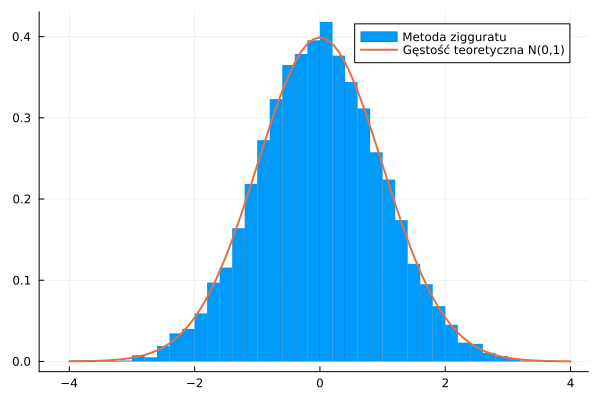

In [32]:
Z = ziggurat(0.05,10^4)[1]
histogram(Z, normalize=:pdf, label="Metoda zigguratu",linewidth=0)
plot!(x->(1/sqrt(2*pi))*exp(-(x^2)/2), -4:0.1:4, label="Gęstość teoretyczna N(0,1)", linewidth=2)

In [33]:
OneSampleADTest(Z,Normal(0,1))

One sample Anderson-Darling test
--------------------------------
Population details:
    parameter of interest:   not implemented yet
    value under h_0:         NaN
    point estimate:          NaN

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.7330

Details:
    number of observations:   10000
    sample mean:              0.002324218125615352
    sample SD:                0.9914168561820568
    A² statistic:             0.5135445397105332


In [34]:
ExactOneSampleKSTest(Z,Normal(0,1))

Exact one sample Kolmogorov-Smirnov test
----------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.00650888

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.7881

Details:
    number of observations:   10000


Porównanie liczby obliczania wartości funkcji w zależności od długości przedziału:

In [35]:
ziggurat(0.1,10^5)[2]

8260

In [36]:
ziggurat(0.01,10^4)[2]

77

In [37]:
ziggurat(1.,10^4)[2]

8047

Im większe przedziały tym częściej musimy wyliczać funkcję.

##### Metoda Zigguratu dla przedziałów o nierównych długościach

Im bliżej zera tym przedziały są mniejsze.

In [38]:
function ziggurat_neq_steps(n)
    xk = [0.001*i^2 for i in 0:0.65:65]
    xlen = length(xk)
    Fmax = [(1/sqrt(2*pi))*exp(-(x^2)/2) for x in xk[1:end-1]]
    Fmin = [(1/sqrt(2*pi))*exp(-(x^2)/2) for x in xk[2:end]]
    Y = Vector{Float64}(undef,n)
    i=1
    counter = 0
    while i <= n
        x = randexp()
        y = rand()*1.33*exp(-x)
        j=1
        while (x>xk[j]&&j<xlen)
            j+=1
        end
        if j < xlen
            if y<=Fmin[j]
                sign=rand((-1,1))
                Y[i] = sign*x
                i+=1
            elseif y<=Fmax[j]
                counter +=1
                if y<= (1/sqrt(2*pi))*exp(-(x^2)/2)
                    sign=rand((-1,1))
                    Y[i] = sign*x
                    i+=1
                end
            end
        elseif y <= (1/sqrt(2*pi))*exp(-(x^2)/2)
            sign=rand((-1,1))
            Y[i] = sign*x
            i+=1
            counter += 1
        end
    end
    return Y, counter
end

ziggurat_neq_steps (generic function with 1 method)

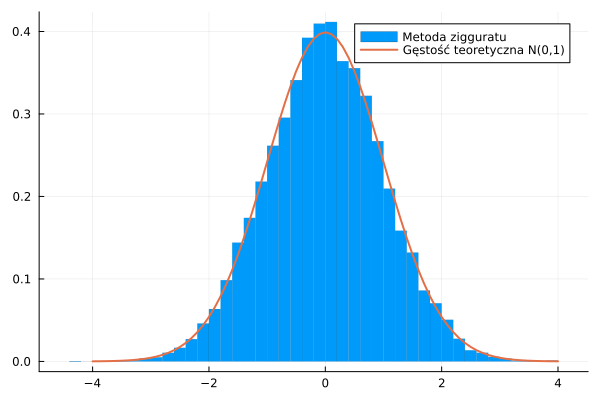

In [39]:
Z = ziggurat_neq_steps(10^4)[1]
histogram(Z, normalize=:pdf, label="Metoda zigguratu",linewidth=0)
plot!(x->(1/sqrt(2*pi))*exp(-(x^2)/2), -4:0.1:4, label="Gęstość teoretyczna N(0,1)", linewidth=2)

Liczba obliczeń funkcji dla 100 przedziałów dla próbki o długości 10^4

In [40]:
ziggurat_neq_steps(10^4)[2]

337

In [41]:
@benchmark ziggurat_neq_steps(10^5)

BenchmarkTools.Trial: 404 samples with 1 evaluation.
 Range (min … max):  10.437 ms … 29.924 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     11.857 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   12.346 ms ±  1.836 ms  ┊ GC (mean ± σ):  0.26% ± 2.36%

      ▅▁▄█▄▆▁ ▁                                                
  ▂▄▅██████████▆▅▄▄▄▂▃▄▄▃▃▁▃▁▃▃▃▂▃▃▃▂▁▃▁▁▁▁▁▂▁▁▁▂▁▂▃▁▂▁▂▁▂▁▂▂ ▃
  10.4 ms         Histogram: frequency by time        19.8 ms <

 Memory estimate: 785.67 KiB, allocs estimate: 7.

In [42]:
@benchmark ziggurat(0.1,10^5)

BenchmarkTools.Trial: 568 samples with 1 evaluation.
 Range (min … max):  7.486 ms … 50.789 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     8.259 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   8.757 ms ±  2.659 ms  ┊ GC (mean ± σ):  0.49% ± 3.44%

    █▄▂▂▁                                                     
  ▅██████▆▆▆▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▂▁▁▁▂ ▃
  7.49 ms        Histogram: frequency by time          16 ms <

 Memory estimate: 785.67 KiB, allocs estimate: 7.

--------

#### ZADANIE 4

Porównanie różnych metod generowania próby z rozkładu normalnego

Przeprowadzone benchmarki oraz testy statystyczne dla każdej metody:

Metoda Box-Mullera

Algorytm:
1. Wygeneruj dwie zmienne losowe $U_1$ i $U_2$ z rozkładu jednostajnego na przedziale [0, 1].
2. Przeprowadź przekształcenie zmiennych losowych $Z_1=\sqrt{−2\ln{⁡U_1}}\cos(2πU_2)$ i $Z_2=\sqrt{−2\ln{⁡U_1}}\sin(2πU_2)$.
3. Zwróć $Z_1$ i $Z_2$ jako dwie zmienne losowe z rozkładu normalnego.

In [43]:
function box_muller()
    E = randexp()
    Θ = rand(Uniform(0,2*pi))

    return sqrt(2*E)*cos(Θ), sqrt(2*E)*sin(Θ)
end

box_muller (generic function with 1 method)

In [44]:
@benchmark [box_muller()[1] for i in 1:10^4]

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):  248.800 μs …  34.802 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     333.750 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   387.059 μs ± 439.288 μs  ┊ GC (mean ± σ):  1.26% ± 2.15%

    ▁▅▂█▃                                                        
  ▄▅██████▆▅▅▄▄▄▃▄▄▅▅▅▅▅▅▄▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▂
  249 μs           Histogram: frequency by time          838 μs <

 Memory estimate: 78.17 KiB, allocs estimate: 2.

Sprawdzamy, czy algorytm działa poprawnie

In [45]:
Z = vcat(collect.([box_muller() for i in 1:5*10^3])...)
ExactOneSampleKSTest(Z,Normal(0,1)) |> display
OneSampleADTest(Z,Normal(0,1)) |> display
JarqueBeraTest(Z) |> display

Exact one sample Kolmogorov-Smirnov test
----------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.0088923

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.4054

Details:
    number of observations:   10000


One sample Anderson-Darling test
--------------------------------
Population details:
    parameter of interest:   not implemented yet
    value under h_0:         NaN
    point estimate:          NaN

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.4214

Details:
    number of observations:   10000
    sample mean:              0.0018163136303188878
    sample SD:                0.9981432110052164
    A² statistic:             0.8885066080562238


Jarque-Bera normality test
--------------------------
Population details:
    parameter of interest:   skewness and kurtosis
    value under h_0:         "0 and 3"
    point estimate:          "-0.057693551800426755 and 2.9950475134534105"

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.0621

Details:
    number of observations:         10000
    JB statistic:                   5.5578


Metoda Marsagali

Algorytm ten polega na zastosowaniu przekształceń liniowych i nieliniowych na dwóch zestawach niezależnych zmiennych losowych o rozkładzie jednostajnym na przedziale (0,1).

In [46]:
function marsaglia()
    X,Y = rand(Uniform(-1,1),2)
    while X^2 + Y^2 >1
        X,Y = rand(Uniform(-1,1),2)
    end
    R = X^2 + Y^2
    return X/sqrt(R) * sqrt(-2*log(R)), Y/sqrt(R) * sqrt(-2*log(R))
end

@benchmark vcat(collect.([marsaglia() for i in 1:5*10^3])...)

BenchmarkTools.Trial: 6164 samples with 1 evaluation.
 Range (min … max):  456.400 μs … 20.762 ms  ┊ GC (min … max):  0.00% … 94.16%
 Time  (median):     641.150 μs              ┊ GC (median):     0.00%
 Time  (mean ± σ):   804.509 μs ±  1.054 ms  ┊ GC (mean ± σ):  10.72% ±  8.24%

  █▁                                                            
  ██▇▆▅▆▇▅▅▄▄▄▃▃▃▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▁▂▂▂▁▁▂▂ ▃
  456 μs          Histogram: frequency by time         2.59 ms <

 Memory estimate: 1.09 MiB, allocs estimate: 11229.

Sprawdzamy, czy algorytm działa poprawnie.

In [47]:
Z = vcat(collect.([marsaglia() for i in 1:5*10^3])...)
ExactOneSampleKSTest(Z,Normal(0,1)) |> display
OneSampleADTest(Z,Normal(0,1)) |> display
JarqueBeraTest(Z) |> display

Exact one sample Kolmogorov-Smirnov test
----------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.0109067

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.1838

Details:
    number of observations:   10000


One sample Anderson-Darling test
--------------------------------
Population details:
    parameter of interest:   not implemented yet
    value under h_0:         NaN
    point estimate:          NaN

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.2126

Details:
    number of observations:   10000
    sample mean:              0.008876454936589812
    sample SD:                0.9925792292267802
    A² statistic:             1.3637515633940531


Jarque-Bera normality test
--------------------------
Population details:
    parameter of interest:   skewness and kurtosis
    value under h_0:         "0 and 3"
    point estimate:          "-0.044036325933314156 and 3.089148423168711"

Test summary:
    outcome with 95% confidence: reject h_0
    one-sided p-value:           0.0379

Details:
    number of observations:         10000
    JB statistic:                   6.54343


Metoda akceptacji-odrzucenia

Algorytm ten polega na przyjęciu losowych próbek z rozkładu prostszego (tzw. rozkładu propozycji) i odrzucaniu części z nich w celu uzyskania próbek z docelowego rozkładu.

In [48]:
function rejection(n)
    Y = Vector{Float64}(undef,n)
    i=1
    rejections = 0
    while i <= n
        x = randexp()
        y = rand()*1.33
        if y <= (2/sqrt(2*pi))*exp(-(x^2)/2 + x)
            sign=rand((-1,1))
            Y[i] = sign*x
            i+=1
        end
        rejections+=1
    end
    return Y,rejections
end
@benchmark rejection(10^4)

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):  232.900 μs …  39.603 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     299.400 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   338.459 μs ± 534.025 μs  ┊ GC (mean ± σ):  1.60% ± 2.15%

     ▂▂█▆▃▂▁                                                     
  ▅▃█████████▇▆▆▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▂
  233 μs           Histogram: frequency by time          744 μs <

 Memory estimate: 78.17 KiB, allocs estimate: 2.

Sprawdzamy, czy algorytm działa poprawnie

In [49]:
Z = rejection(10^4)[1]
ExactOneSampleKSTest(Z,Normal(0,1)) |> display
OneSampleADTest(Z,Normal(0,1)) |> display
JarqueBeraTest(Z) |> display

Exact one sample Kolmogorov-Smirnov test
----------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.00626987

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.8242

Details:
    number of observations:   10000


One sample Anderson-Darling test
--------------------------------
Population details:
    parameter of interest:   not implemented yet
    value under h_0:         NaN
    point estimate:          NaN

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.6579

Details:
    number of observations:   10000
    sample mean:              -0.007144437057276943
    sample SD:                0.9922890174584331
    A² statistic:             0.5895552200531803


Jarque-Bera normality test
--------------------------
Population details:
    parameter of interest:   skewness and kurtosis
    value under h_0:         "0 and 3"
    point estimate:          "0.012805253430412472 and 2.966049348263222"

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.6861

Details:
    number of observations:         10000
    JB statistic:                   0.75356


Metoda odwrotnej dystrybuanty

In [50]:
rev_cdf_normal(m,σ,n) = quantile.(Normal(m,σ),rand(n))
@benchmark rev_cdf_normal(0,1,10^4)

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):  164.000 μs …  15.753 ms  ┊ GC (min … max): 0.00% … 97.56%
 Time  (median):     246.700 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   322.658 μs ± 411.514 μs  ┊ GC (mean ± σ):  3.62% ±  3.21%

  ▃▆▇▅█▃                                                         
  ███████▅▅▅▅▄▄▅▆▄▄▄▄▄▄▃▃▃▃▂▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▃
  164 μs           Histogram: frequency by time          940 μs <

 Memory estimate: 156.34 KiB, allocs estimate: 4.

In [51]:
Z = rev_cdf_normal(0,1,10^4)
ExactOneSampleKSTest(Z,Normal(0,1)) |> display
OneSampleADTest(Z,Normal(0,1)) |> display
JarqueBeraTest(Z) |> display

Exact one sample Kolmogorov-Smirnov test
----------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.00820132

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.5091

Details:
    number of observations:   10000


One sample Anderson-Darling test
--------------------------------
Population details:
    parameter of interest:   not implemented yet
    value under h_0:         NaN
    point estimate:          NaN

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.6110

Details:
    number of observations:   10000
    sample mean:              -0.006747794691706707
    sample SD:                1.0105507332609758
    A² statistic:             0.6399606876669015


Jarque-Bera normality test
--------------------------
Population details:
    parameter of interest:   skewness and kurtosis
    value under h_0:         "0 and 3"
    point estimate:          "0.008362412604940027 and 3.092393551492956"

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.1593

Details:
    number of observations:         10000
    JB statistic:                   3.67345


Metoda Zigguratu (jest zaimplementowania w 3 zadaniu)

In [52]:
@benchmark ziggurat(0.1,10^4)

BenchmarkTools.Trial: 4366 samples with 1 evaluation.
 Range (min … max):  761.200 μs …  47.800 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):       1.037 ms               ┊ GC (median):    0.00%
 Time  (mean ± σ):     1.122 ms ± 894.538 μs  ┊ GC (mean ± σ):  0.53% ± 1.95%

        ▃█▄                                                      
  ▇█▅▄▆▇████▆▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▂
  761 μs           Histogram: frequency by time         3.02 ms <

 Memory estimate: 82.55 KiB, allocs estimate: 7.

Sprawdzamy, czy algorytm działa poprawnie

In [53]:
Z = ziggurat(0.1,10^4)[1]
ExactOneSampleKSTest(Z,Normal(0,1)) |> display
OneSampleADTest(Z,Normal(0,1)) |> display
JarqueBeraTest(Z) |> display

Exact one sample Kolmogorov-Smirnov test
----------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.0118072

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.1221

Details:
    number of observations:   10000


One sample Anderson-Darling test
--------------------------------
Population details:
    parameter of interest:   not implemented yet
    value under h_0:         NaN
    point estimate:          NaN

Test summary:
    outcome with 95% confidence: reject h_0
    one-sided p-value:           0.0390

Details:
    number of observations:   10000
    sample mean:              0.008922446859027695
    sample SD:                0.9745931383932278
    A² statistic:             2.69871510273434


Jarque-Bera normality test
--------------------------
Population details:
    parameter of interest:   skewness and kurtosis
    value under h_0:         "0 and 3"
    point estimate:          "-0.03498248348788646 and 3.032608702029303"

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.2890

Details:
    number of observations:         10000
    JB statistic:                   2.48268


Metoda stosunku jednostajnych

In [54]:
function normal(m, σ)
    x=rand()
    y=rand(Uniform(-0.9,0.9))
    while -sqrt(-4*x^2*log(x))>y||sqrt(-4*x^2*log(x))<y
        x=rand()
        y=rand(Uniform(-0.9,0.9))
    end
    return  σ*y/x + m
end

@benchmark [normal(0,1) for i in 1:10^4]

BenchmarkTools.Trial: 9746 samples with 1 evaluation.
 Range (min … max):  360.400 μs …  10.932 ms  ┊ GC (min … max): 0.00% … 94.38%
 Time  (median):     461.300 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   505.426 μs ± 261.367 μs  ┊ GC (mean ± σ):  0.96% ±  2.14%

      ▅▇█▁                                                       
  ▅▇█▅████▆▆▆▆▅▆▇▇▇▆▆▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂ ▃
  360 μs           Histogram: frequency by time         1.05 ms <

 Memory estimate: 78.17 KiB, allocs estimate: 2.

Sprawdzamy, czy algorytm działa poprawanie.

In [55]:
Z = [normal(0,1) for i in 1:10^4]
ExactOneSampleKSTest(Z,Normal(0,1)) |> display
OneSampleADTest(Z,Normal(0,1)) |> display
JarqueBeraTest(Z) |> display

Exact one sample Kolmogorov-Smirnov test
----------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.0149028

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           0.0233

Details:
    number of observations:   10000


One sample Anderson-Darling test
--------------------------------
Population details:
    parameter of interest:   not implemented yet
    value under h_0:         NaN
    point estimate:          NaN

Test summary:
    outcome with 95% confidence: reject h_0
    one-sided p-value:           0.0340

Details:
    number of observations:   10000
    sample mean:              -0.02221696018564705
    sample SD:                0.9951142775278794
    A² statistic:             2.8139230558246373


Jarque-Bera normality test
--------------------------
Population details:
    parameter of interest:   skewness and kurtosis
    value under h_0:         "0 and 3"
    point estimate:          "0.000598436886073673 and 3.0056778715577788"

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.9930

Details:
    number of observations:         10000
    JB statistic:                   0.0140295


-----

#### ZADANIE 5

Będziemy generować dwuwymiarowy rozkład normalny. Zależność zmiennych X i Y będzie określona za pomocą macierzy kowarjancji.
Przyjmująć wariancję X i Y jako 1 korelacja i kowarjancja tych zmiennych będą sobie równe.

In [56]:
function two_normal(μ,Σ,n)
    W = rand(MvNormal(μ,Σ),n)
    X = W[1,:]
    Y = W[2,:]
    return X, Y
end

two_normal (generic function with 1 method)

Wektory Z1, Z2, Z3 będą zawierały odpowiednio próby o długości $10^4$ ze zmiennych $X+Y$, $X-Y$, $X^2+Y^2$ dla różnych korelacji zmiennych X i Y

In [57]:
Z1 = Vector(undef,19)
Z2 = Vector(undef,19)
Z3 = Vector(undef,19)
for i in -0.9:0.1:0.9
    Σ=[1 i;i 1]
    μ = [0,0]
    X,Y = two_normal(μ,Σ,10^4)
    Z1[Int(i*10+10)] = X+Y
    Z2[Int(i*10+10)] = X-Y
    Z3[Int(i*10+10)] = X.^2 + Y.^2
end

Porównanie wariancji zmiennej $X+Y$ w zależności od korelacji X i Y

Var(X+Y), cor(X,Y)=-0.9: 0.198813136402555
Var(X+Y), cor(X,Y)=-0.8: 0.4082777988348841
Var(X+Y), cor(X,Y)=-0.7: 0.6035394866929973
Var(X+Y), cor(X,Y)=-0.6: 0.7980959361468688
Var(X+Y), cor(X,Y)=-0.5: 0.9949322497043938
Var(X+Y), cor(X,Y)=-0.4: 1.164247256244593
Var(X+Y), cor(X,Y)=-0.3: 1.3926425168098624
Var(X+Y), cor(X,Y)=-0.2: 1.6270538749915358
Var(X+Y), cor(X,Y)=-0.1: 1.837801596770107
Var(X+Y), cor(X,Y)=0.0: 2.017383974041508
Var(X+Y), cor(X,Y)=0.1: 2.168777221593906
Var(X+Y), cor(X,Y)=0.2: 2.413199281733451
Var(X+Y), cor(X,Y)=0.3: 2.6094552356382223
Var(X+Y), cor(X,Y)=0.4: 2.782370661191557
Var(X+Y), cor(X,Y)=0.5: 2.9444985346539716
Var(X+Y), cor(X,Y)=0.6: 3.2221067905797756
Var(X+Y), cor(X,Y)=0.7: 3.434615617053157
Var(X+Y), cor(X,Y)=0.8: 3.600663357551443


Var(X+Y), cor(X,Y)=0.9: 3.7559485334287066


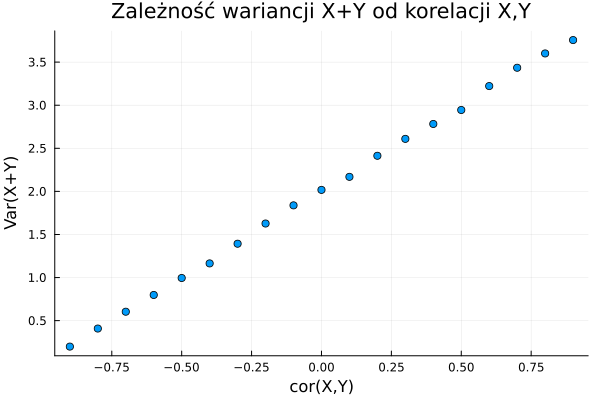

In [58]:
for i in 1:19
    println("Var(X+Y), cor(X,Y)=$((i-10)/10): $(var(Z1[i]))")
end
scatter([(i-10)/10 for i in 1:19], [var(Z1[i]) for i in 1:19], ylabel="Var(X+Y)", xlabel="cor(X,Y)", legend=false, title="Zależność wariancji X+Y od korelacji X,Y")

$$Var(X+Y) = 2\cdot cov(X+Y)+2$$

$$E(X+Y)=E(X)+E(Y)$$
$$E(X+Y)=0$$

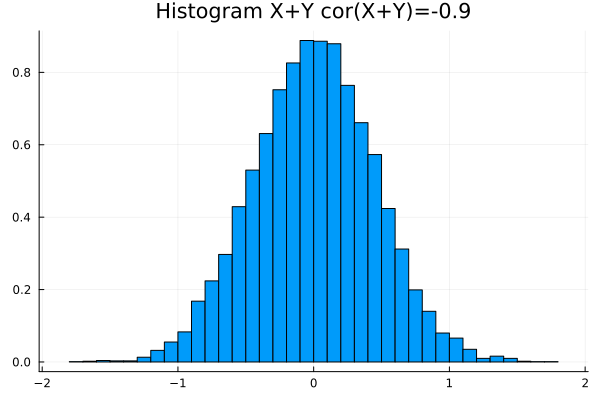

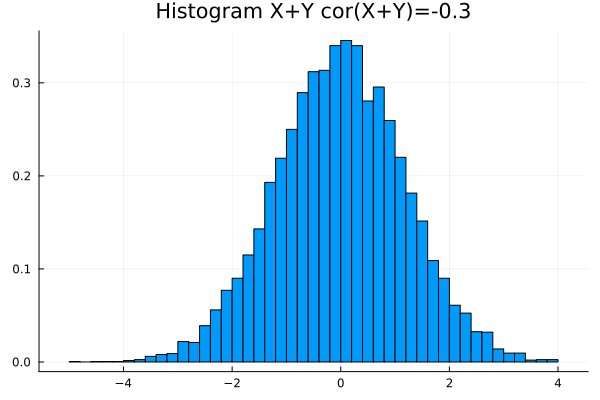

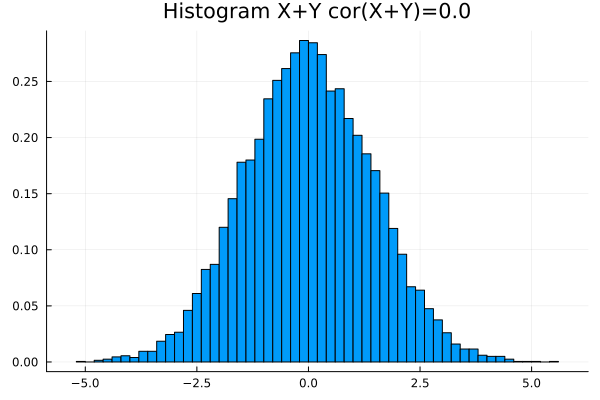

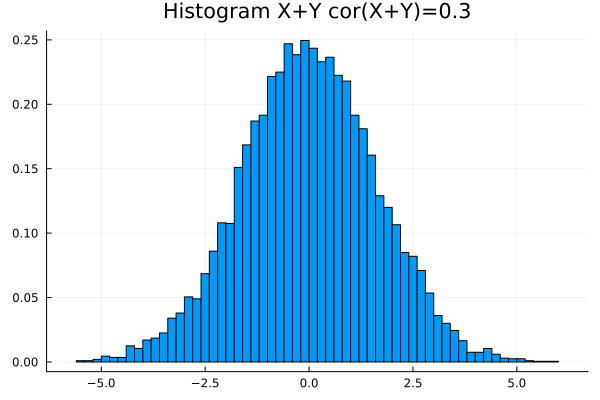

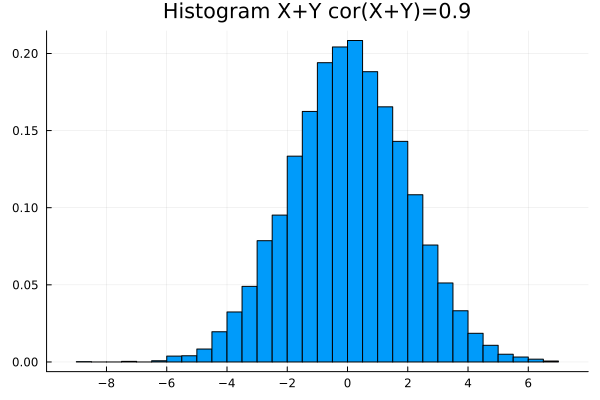

In [59]:
for i in [1,7,10,13,19]
    display(histogram(Z1[i], normalize=:pdf, legend=false, title="Histogram X+Y cor(X+Y)=$((i-10)/10)"))
end

Porównanie wariancji zmiennej $X-Y$ w zależności od korelacji X i Y

Var(X-Y), cor(X,Y)=-0.9: 3.7752800067404038
Var(X-Y), cor(X,Y)=-0.8: 3.5441468259699755
Var(X-Y), cor(X,Y)=-0.7: 3.404769204530385
Var(X-Y), cor(X,Y)=-0.6: 3.3040257011302057
Var(X-Y), cor(X,Y)=-0.5: 3.0110869311853476
Var(X-Y), cor(X,Y)=-0.4: 2.847813347013407
Var(X-Y), cor(X,Y)=-0.3: 2.6113577209168266
Var(X-Y), cor(X,Y)=-0.2: 2.4398485633589795
Var(X-Y), cor(X,Y)=-0.1: 2.213267055441259
Var(X-Y), cor(X,Y)=0.0: 1.9475344871171458
Var(X-Y), cor(X,Y)=0.1: 1.7739819728341888
Var(X-Y), cor(X,Y)=0.2: 1.5866883363738564
Var(X-Y), cor(X,Y)=0.3: 1.402581906924563
Var(X-Y), cor(X,Y)=0.4: 1.1874048630712724
Var(X-Y), cor(X,Y)=0.5: 1.004790737245073


Var(X-Y), cor(X,Y)=0.6: 0.7918151238480982
Var(X-Y), cor(X,Y)=0.7: 0.5959654103393224
Var(X-Y), cor(X,Y)=0.8: 0.3874539002169289
Var(X-Y), cor(X,Y)=0.9: 0.19834917233753951


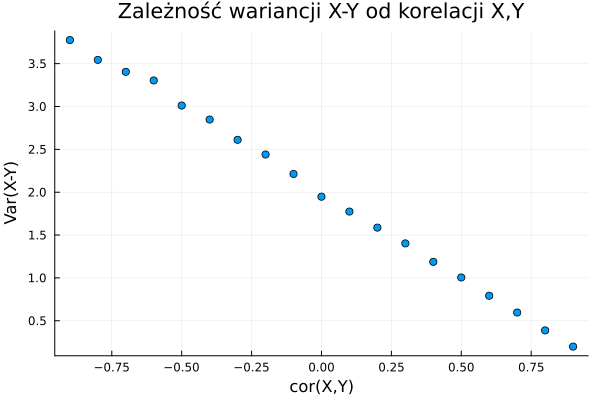

In [68]:
for i in 1:19
    println("Var(X-Y), cor(X,Y)=$((i-10)/10): $(var(Z2[i]))")
end

scatter([(i-10)/10 for i in 1:19], [var(Z2[i]) for i in 1:19], ylabel="Var(X-Y)", xlabel="cor(X,Y)", legend=false, title="Zależność wariancji X-Y od korelacji X,Y")

$$Var(X-Y)=-2 \cdot cov(X-Y) + 2$$

$$E(X-Y)=E(X)-E(Y)$$
$$E(X-Y)=0$$

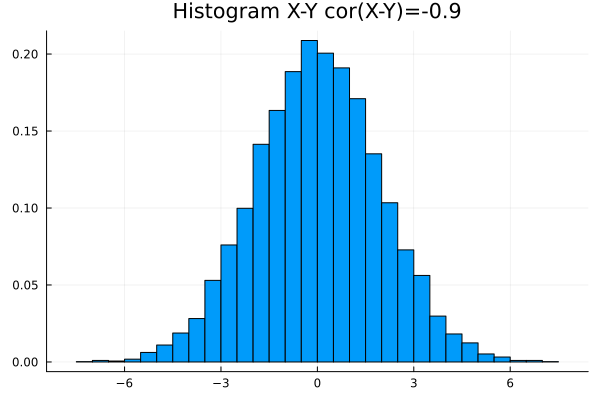

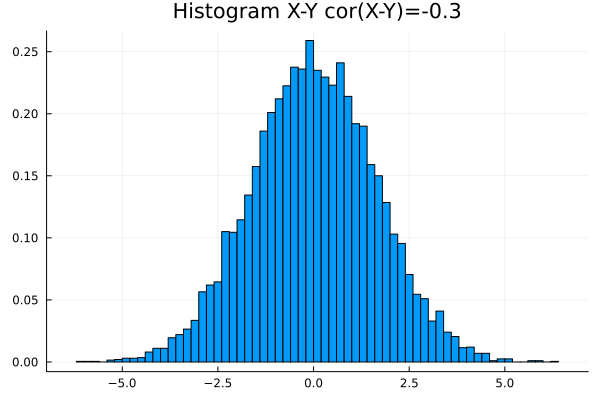

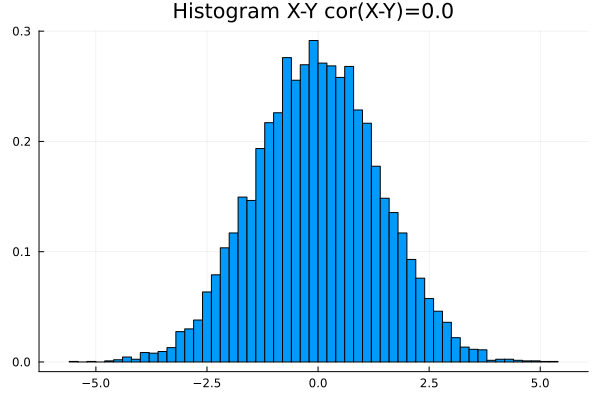

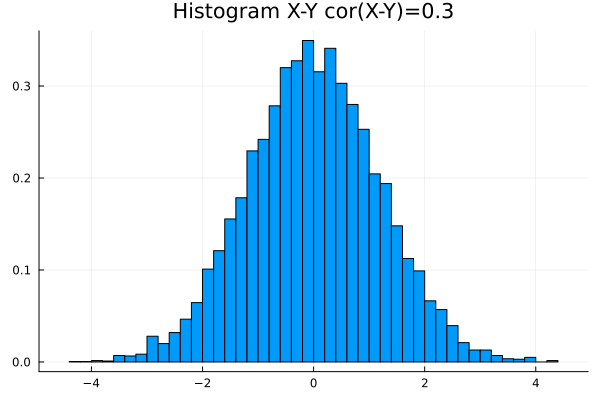

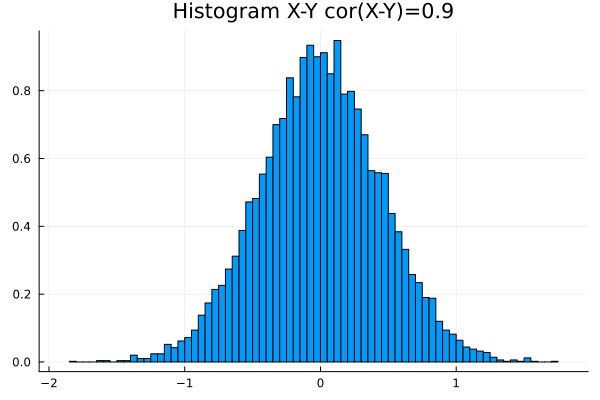

In [65]:
for i in [1,7,10,13,19]
    display(histogram(Z2[i], normalize=:pdf, legend=false, title="Histogram X-Y cor(X-Y)=$((i-10)/10)"))
end

In [ ]:
Porównanie wariancji zmiennej $X^2+Y^2$ w zależności od korelacji X i Y

cor(X,Y)=-0.9 Var(X^2 + Y^2): 7.1831083732408425


cor(X,Y)=-0.8 Var(X^2 + Y^2): 6.417523348416548
cor(X,Y)=-0.7 Var(X^2 + Y^2): 6.115675127362413
cor(X,Y)=-0.6 Var(X^2 + Y^2): 5.935195110221392
cor(X,Y)=-0.5 Var(X^2 + Y^2): 5.015557202435004
cor(X,Y)=-0.4 Var(X^2 + Y^2): 4.777966717579738
cor(X,Y)=-0.3 Var(X^2 + Y^2): 4.337194801755143
cor(X,Y)=-0.2 Var(X^2 + Y^2): 4.357495355967614
cor(X,Y)=-0.1 Var(X^2 + Y^2): 4.349968876393003
cor(X,Y)=0.0 Var(X^2 + Y^2): 3.8797469575536403
cor(X,Y)=0.1 Var(X^2 + Y^2): 3.9812780825828984
cor(X,Y)=0.2 Var(X^2 + Y^2): 4.196634667642322
cor(X,Y)=0.3 Var(X^2 + Y^2): 4.390612152267279
cor(X,Y)=0.4 Var(X^2 + Y^2): 4.625793270656685
cor(X,Y)=0.5 Var(X^2 + Y^2): 4.779670023800332
cor(X,Y)=0.6 Var(X^2 + Y^2): 5.551983554421735
cor(X,Y)=0.7 Var(X^2 + Y^2): 6.072605917405011
cor(X,Y)=0.8 Var(X^2 + Y^2): 6.338485952999029
cor(X,Y)=0.9 Var(X^2 + Y^2): 7.133653386601448


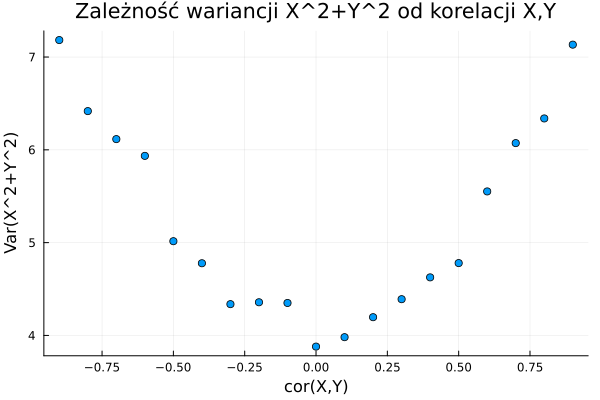

In [67]:
for i in 1:19
    println("cor(X,Y)=$((i-10)/10) Var(X^2 + Y^2): $(var(Z3[i]))")
end
scatter([(i-10)/10 for i in 1:19], [var(Z3[i]) for i in 1:19], ylabel="Var(X^2+Y^2)", xlabel="cor(X,Y)", legend=false, title="Zależność wariancji X^2+Y^2 od korelacji X,Y")

$$Var(X^2 + Y^2)=4\cdot cov(X^2 + Y^2)^2 + 4$$

cor(X^2 + Y^2)=-0.9 mean(X^2 + Y^2): 1.9869157030704312
cor(X^2 + Y^2)=-0.8 mean(X^2 + Y^2): 1.9760821870356573
cor(X^2 + Y^2)=-0.7 mean(X^2 + Y^2): 2.0039736821679406
cor(X^2 + Y^2)=-0.6 mean(X^2 + Y^2): 2.050895711206788
cor(X^2 + Y^2)=-0.5 mean(X^2 + Y^2): 2.0028690498085204
cor(X^2 + Y^2)=-0.4 mean(X^2 + Y^2): 2.0058862039686813
cor(X^2 + Y^2)=-0.3 mean(X^2 + Y^2): 2.001987036967142
cor(X^2 + Y^2)=-0.2 mean(X^2 + Y^2): 2.0333080744620884
cor(X^2 + Y^2)=-0.1 mean(X^2 + Y^2): 2.0254715593289085
cor(X^2 + Y^2)=0.0 mean(X^2 + Y^2): 1.982416410703244
cor(X^2 + Y^2)=0.1 mean(X^2 + Y^2): 1.9716076796304944
cor(X^2 + Y^2)=0.2 mean(X^2 + Y^2): 1.999981369848684
cor(X^2 + Y^2)=0.3 mean(X^2 + Y^2): 2.0058353157807285
cor(X^2 + Y^2)=0.4 mean(X^2 + Y^2): 1.9849130888498667
cor(X^2 + Y^2)=0.5 mean(X^2 + Y^2): 1.9744706438350557
cor(X^2 + Y^2)=0.6 mean(X^2 + Y^2): 2.006766156302178
cor(X^2 + Y^2)=0.7 mean(X^2 + Y^2): 2.0152775807509795
cor(X^2 + Y^2)=0.8 mean(X^2 + Y^2): 1.993970903518293
cor(X^2

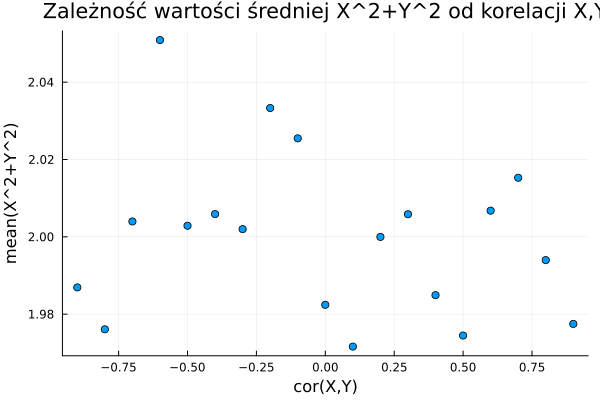

In [63]:
for i in 1:19
    println("cor(X^2 + Y^2)=$((i-10)/10) mean(X^2 + Y^2): $(mean(Z3[i]))")
end
scatter([(i-10)/10 for i in 1:19], [mean(Z3[i]) for i in 1:19], ylabel="mean(X^2+Y^2)", xlabel="cor(X,Y)", legend=false, title="Zależność wartości średniej X^2+Y^2 od korelacji X,Y")

$$E(X^2+Y^2)\approx 2$$

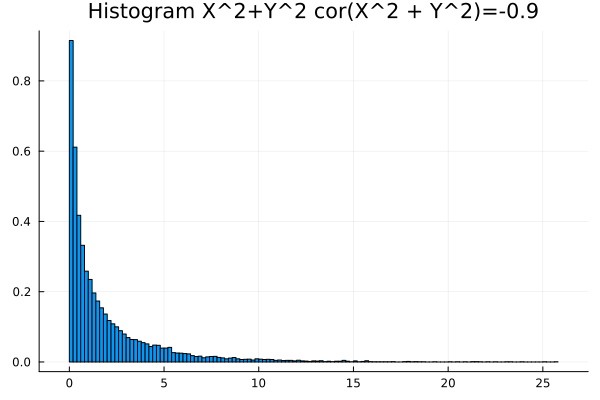

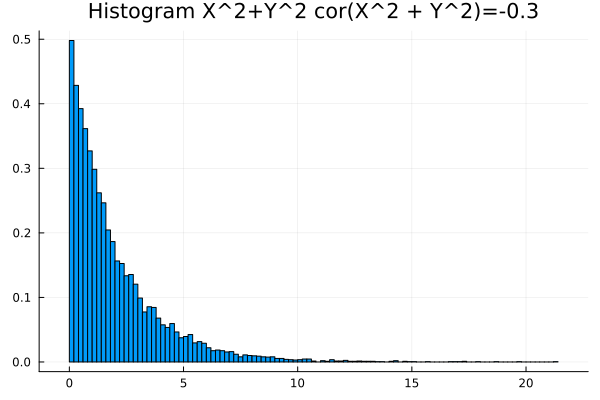

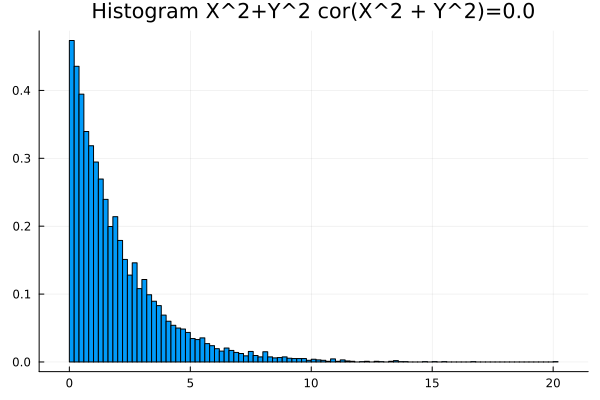

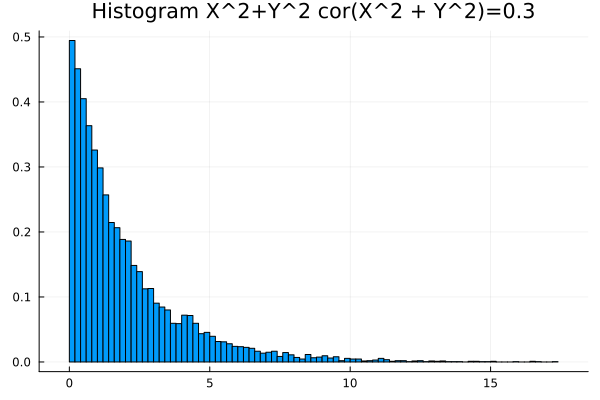

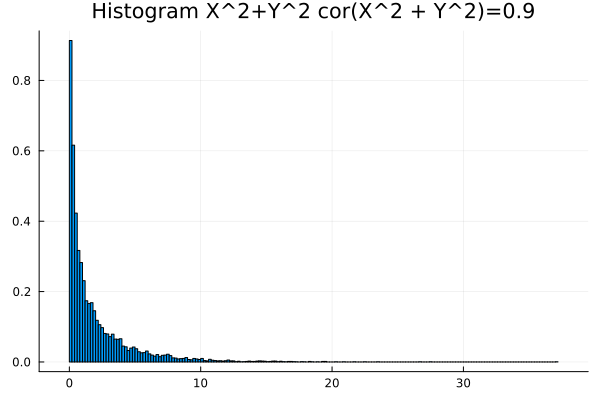

In [66]:
for i in [1,7,10,13,19]
    display(histogram(Z3[i], normalize=:pdf, legend=false, title="Histogram X^2+Y^2 cor(X^2 + Y^2)=$((i-10)/10)"))
end


Im mniejsza wariancja tym wartości są bardziej skupione wokół wartości średniej. Dla $X+Y$ taka sytuacja ma miejsce, gdy korelacja jest blisko -1, dla $X-Y$, gdy korelacja jest bliso 1, a dla $X^2+Y^2$, gdy korelacja jest bliska 0.